In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
%cd /content/gdrive/MyDrive/

/content/gdrive/MyDrive


In [4]:
!unzip -q arch.zip

replace test/nowildfire/-113.91777,50.901087.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [5]:
from PIL import Image
from matplotlib.pyplot import imshow
import pandas
import matplotlib.pylab as plt
import os
import glob

In [6]:
def show_data(data_sample, loop, class_name):
  for i in range(loop):
    image = Image.open(data_sample[i])
    plt.imshow(image)
    plt.title(f"y = {class_name}")
    plt.show()

In [7]:
directory="/content/gdrive/MyDrive/train"


In [8]:
wildfire='wildfire'



In [9]:
nowildfire="nowildfire"



In [10]:
wildfire_file_path=os.path.join(directory, wildfire)
wildfire_files=[os.path.join(wildfire_file_path, file) for file in  os.listdir(wildfire_file_path) if file.endswith(".jpg")]
wildfire_files.sort()
wildfire_files[0:5]

['/content/gdrive/MyDrive/train/wildfire/-57.11902,51.47242.jpg',
 '/content/gdrive/MyDrive/train/wildfire/-57.8088,51.44634.jpg',
 '/content/gdrive/MyDrive/train/wildfire/-58.657,51.1945.jpg',
 '/content/gdrive/MyDrive/train/wildfire/-58.71402,51.32554.jpg',
 '/content/gdrive/MyDrive/train/wildfire/-58.7312,51.2023.jpg']

In [11]:
nowildfire_file_path=os.path.join(directory, nowildfire)
nowildfire_files=[os.path.join(nowildfire_file_path, file) for file in os.listdir(nowildfire_file_path) if file.endswith(".jpg")]
nowildfire_files.sort()
nowildfire_files[0:5]

['/content/gdrive/MyDrive/train/nowildfire/-113.917243,51.101323.jpg',
 '/content/gdrive/MyDrive/train/nowildfire/-113.917264,50.966686.jpg',
 '/content/gdrive/MyDrive/train/nowildfire/-113.917465,51.051057.jpg',
 '/content/gdrive/MyDrive/train/nowildfire/-113.917555,51.071225.jpg',
 '/content/gdrive/MyDrive/train/nowildfire/-113.917557,51.165343.jpg']

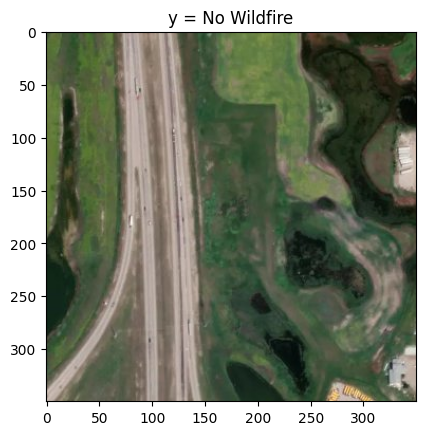

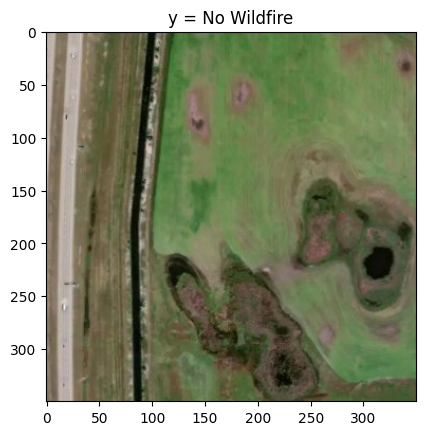

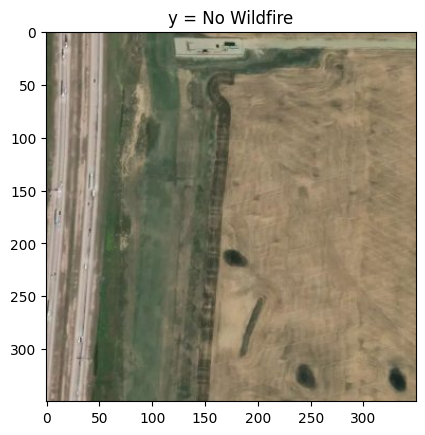

In [12]:
show_data(nowildfire_files, 3, 'No Wildfire')


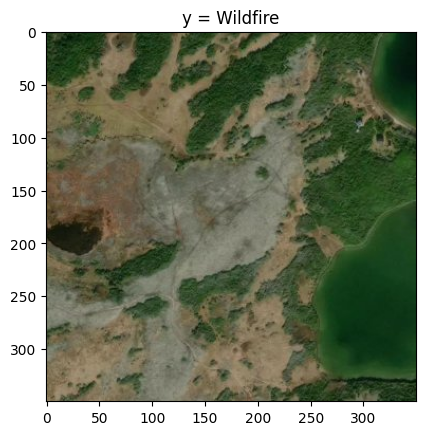

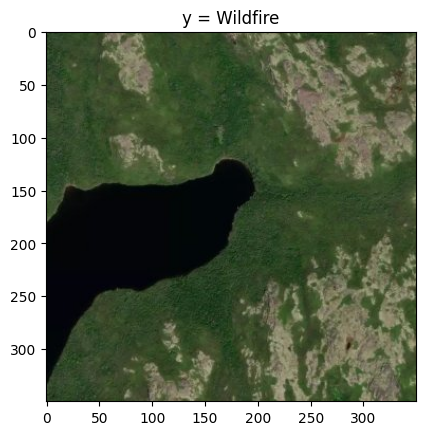

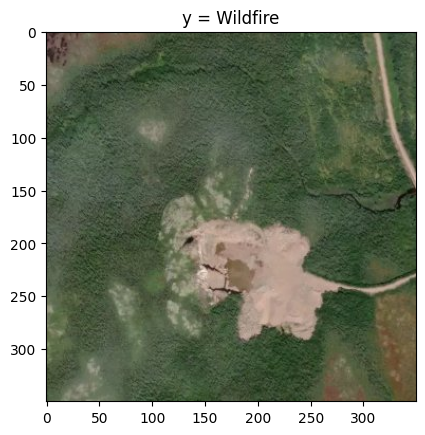

In [13]:
show_data(wildfire_files, 3, 'Wildfire')


In [14]:
import os
import tensorflow as tf
import datetime
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import scipy as sp
import cv2
import numpy as np


In [15]:
for device in tf.config.list_physical_devices():
    print(f"{device.name}")

/physical_device:CPU:0


In [16]:
try:
    # %tensorflow_version only exists in Colab.
    get_ipython().run_line_magic('tensorflow_version', '2.x')
except Exception:
    pass

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [17]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Input, Dense, Conv2D, MaxPool2D, BatchNormalization,  GlobalAveragePooling2D
from tensorflow.keras.callbacks import TensorBoard

import warnings
warnings.filterwarnings("ignore")

In [18]:
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [19]:
def plot_loss(history):
  plt.figure(figsize=(20, 10))
  sns.set_style('whitegrid')
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Wildfire Model Loss')
  plt.ylabel('Loss')
  plt.xlabel('Epochs')
  plt.legend(['loss', 'val_loss'], loc='upper left')
  plt.show()

In [20]:
def plot_acc(history):
  plt.figure(figsize=(20, 10))
  sns.set_style('whitegrid')
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.title('Wildfire Model Accuracy')
  plt.ylabel('Accuracy')
  plt.xlabel('Epoch')
  plt.legend(['accuracy', 'val_accuracy'], loc='upper left')
  plt.show()

In [21]:
%cd /content/gdrive/MyDrive/


/content/gdrive/MyDrive


In [22]:
!mkdir -p saved_model
!mkdir -p predictions
!mkdir -p model_plots

In [ ]:
%ls


'2nd puc (1).jpg'
'2nd puc.jpg'
 Adi_resume.pdf
'adithya 10th marks card.pdf'
'Adithya S'/
'AI ML course.gdoc'
 appa/
'archive (1)'/
'archive (2).zip'
 arch.zip
 Astra/
 Checklist.gsheet
'Colab Notebooks'/
 comedk1.pdf
 comedk2.pdf
 comedk3.pdf
'Constitution v4 2022-23 (1).pdf'
 content/
 CUK0012118.pdf
 DevOps.gdoc
'full commands.gdoc'
 good/
 IEEE-Bangalore-Section-Amended-By-Laws-6-January-2017.pdf
 ieee-constitution-and-bylaws.pdf
 IMG_20230304_143557579.jpg
'IMG_20230304_143602166 (1).jpg'
 IMG_20230304_143602166.jpg
'IMG_20230304_143602643 (1).jpg'
 IMG_20230304_143602643.jpg
'IMG_20230304_143603341 (1).jpg'
 IMG_20230304_143603341.jpg
 IMG_20240126_114532701_HDR~3.jpg
 IMG-20240831-WA0033~3.jpg
 jenkins_1_commands.gdoc
'keaapplicationpd_49202018147099_25062022_122504-1 (1).pdf'
'keaapplicationpd_49202018147099_25062022_122504-1 (3).pdf'
'keaapplicationpd_49202018147099_25062022_122504-1 (4).pdf'
 keaapplicationpd_49202018147099_25062022_122504-1.pdf
'ML Matrix.pptx'
 model_plots

In [23]:
train_path = "/content/gdrive/MyDrive/train"
valid_path = "/content/gdrive/MyDrive/valid"
test_path = "/content/gdrive/MyDrive/test"

In [24]:
im_size = 224 #@param {type:"slider", min:64, max:350, step:1}
image_resize = (im_size, im_size, 3)
batch_size_training = 100 #@param {type:"number"}
batch_size_validation = 100 #@param {type:"number"}
batch_size_test = 100 #@param {type:"number"}
num_classes = 2 #@param {type:"number"}

In [25]:
data_generator = ImageDataGenerator(dtype='float32', rescale= 1./255.)


In [26]:
train_generator = data_generator.flow_from_directory(train_path,
                                                   batch_size = batch_size_training,
                                                   target_size = (im_size, im_size),
                                                   class_mode = 'categorical')

valid_generator = data_generator.flow_from_directory(valid_path,
                                                   batch_size = batch_size_validation,
                                                   target_size = (im_size, im_size),
                                                   class_mode = 'categorical')

Found 30250 images belonging to 2 classes.
Found 6300 images belonging to 2 classes.


In [27]:
class_mapping = train_generator.class_indices
class_mapping

{'nowildfire': 0, 'wildfire': 1}

In [28]:
first_batch_train = next(train_generator)  # Use next() with the generator as an argument
first_batch_train

(array([[[[0.18823531, 0.30980393, 0.2509804 ],
          [0.18431373, 0.30588236, 0.24705884],
          [0.18039216, 0.3019608 , 0.24313727],
          ...,
          [0.18431373, 0.31764707, 0.2627451 ],
          [0.16078432, 0.29411766, 0.2392157 ],
          [0.17254902, 0.30588236, 0.2509804 ]],
 
         [[0.18039216, 0.3019608 , 0.24313727],
          [0.17254902, 0.29411766, 0.23529413],
          [0.16862746, 0.2901961 , 0.23137257],
          ...,
          [0.19607845, 0.32941177, 0.27450982],
          [0.16470589, 0.29803923, 0.24313727],
          [0.1764706 , 0.30980393, 0.25490198]],
 
         [[0.1764706 , 0.29803923, 0.2392157 ],
          [0.17254902, 0.29411766, 0.23529413],
          [0.17254902, 0.29411766, 0.23529413],
          ...,
          [0.16862746, 0.3019608 , 0.24705884],
          [0.14117648, 0.27450982, 0.21960786],
          [0.15686275, 0.2901961 , 0.23529413]],
 
         ...,
 
         [[0.16078432, 0.29411766, 0.2392157 ],
          [0.16470

In [29]:
first_batch_valid =next(valid_generator)
first_batch_valid

(array([[[[0.3137255 , 0.35686275, 0.2392157 ],
          [0.2392157 , 0.2784314 , 0.17254902],
          [0.21568629, 0.25490198, 0.14901961],
          ...,
          [0.22352943, 0.31764707, 0.25490198],
          [0.36078432, 0.4431373 , 0.36862746],
          [0.36862746, 0.43921572, 0.34509805]],
 
         [[0.25882354, 0.29803923, 0.19215688],
          [0.25882354, 0.29803923, 0.19215688],
          [0.24313727, 0.28235295, 0.1764706 ],
          ...,
          [0.20000002, 0.29411766, 0.23137257],
          [0.32156864, 0.4039216 , 0.32941177],
          [0.10980393, 0.18039216, 0.09411766]],
 
         [[0.23137257, 0.27058825, 0.16470589],
          [0.24705884, 0.28627452, 0.18039216],
          [0.23529413, 0.27450982, 0.1764706 ],
          ...,
          [0.03921569, 0.13333334, 0.07058824],
          [0.14509805, 0.227451  , 0.16078432],
          [0.03921569, 0.1137255 , 0.03529412]],
 
         ...,
 
         [[0.27450982, 0.3254902 , 0.20784315],
          [0.27450

In [30]:
## labels = np.array(['nowildfire', 'wildfire'])
class_names = list(train_generator.class_indices.keys())
print("Class names :", class_names) # Changed class_names_valid to class_names

Class names : ['nowildfire', 'wildfire']


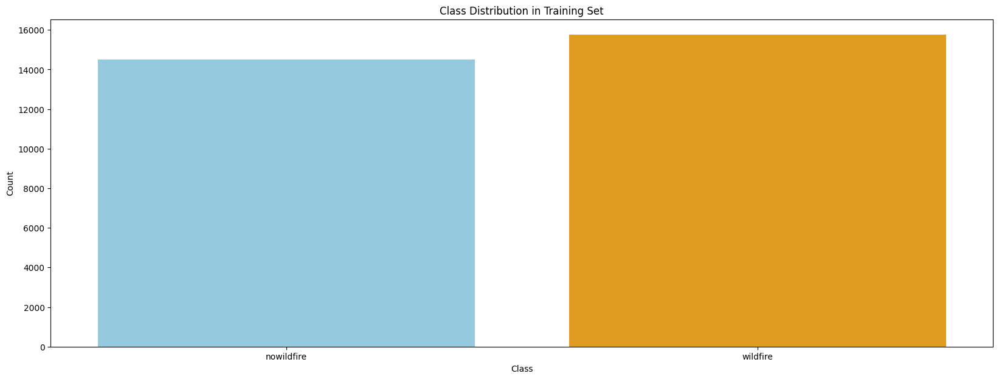

In [31]:
custom_palette = {'nowildfire': 'skyblue', 'wildfire': 'orange'}

data = pd.DataFrame({'Class': class_names, 'Count': [sum(train_generator.labels == c) for c in range(num_classes)]})

plt.figure(figsize=(20, 7))
sns.barplot(x='Class', y='Count', data=data, palette=custom_palette)
plt.title('Class Distribution in Training Set')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

In [32]:
labels_train = train_generator.classes
unique_labels_train, label_counts_train = np.unique(labels_train, return_counts=True)

print("Number of unique labels in train data:", len(unique_labels_train))
for label, count in zip(unique_labels_train, label_counts_train):
    print("Label:", class_names[label], "- Count:", count)

Number of unique labels in train data: 2
Label: nowildfire - Count: 14500
Label: wildfire - Count: 15750


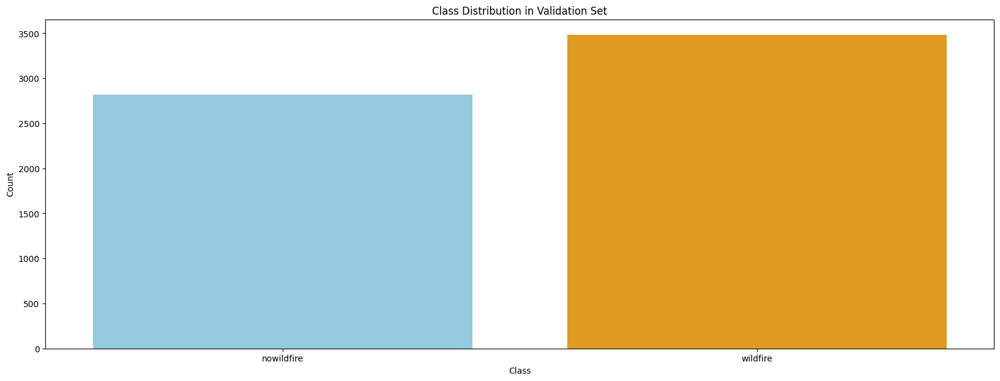

In [33]:
custom_palette = {'nowildfire': 'skyblue', 'wildfire': 'orange'}

data = pd.DataFrame({'Class': class_names, 'Count': [sum(valid_generator.labels == c) for c in range(num_classes)]})

plt.figure(figsize=(20, 7))
sns.barplot(x='Class', y='Count', data=data, palette=custom_palette)
plt.title('Class Distribution in Validation Set')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

In [34]:
labels_valid = valid_generator.classes
unique_labels_valid, label_counts_valid = np.unique(labels_valid, return_counts=True)

print("Number of unique labels in valid data:", len(unique_labels_valid))
for label, count in zip(unique_labels_valid, label_counts_valid):
    print("Label:", class_names[label], "- Count:", count) # Changed class_names_valid to class_names

Number of unique labels in valid data: 2
Label: nowildfire - Count: 2820
Label: wildfire - Count: 3480


In [35]:
model = load_model('saved_model/custom_best_model.h5')

In [36]:
def base_model(input_shape, repetitions):

  input_ = tf.keras.layers.Input(shape=input_shape, name='input')
  x = input_

  for i in range(repetitions):
    n_filters = 2**(4 + i)
    x = Conv2D(n_filters, 3, activation='relu')(x)
    x = BatchNormalization()(x)
    x = MaxPool2D(2)(x)

  return x, input_

In [37]:
def final_model(input_shape, repetitions):

    x, input_ = base_model(input_shape, repetitions)

    x = Conv2D(64, 3, activation='relu')(x)
    x = GlobalAveragePooling2D()(x)
    class_out = Dense(num_classes, activation='softmax', name='class_out')(x)

    model = Model(inputs=input_, outputs=class_out)

    print(model.summary())
    return model

In [38]:
model = final_model(image_resize, 4)


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)                   │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 222, 222, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 222, 222, 16)        │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 32)        │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 109, 109, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 52, 52, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 52, 52, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 26, 26, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 24, 24, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 24, 24, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 12, 12, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 10, 10, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 64)                  │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ class_out (Dense)                    │ (None, 2)                   │             130 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 172,322 (673.13 KB)

 Trainable params: 171,842 (671.26 KB)

 Non-trainable params: 480 (1.88 KB)

None


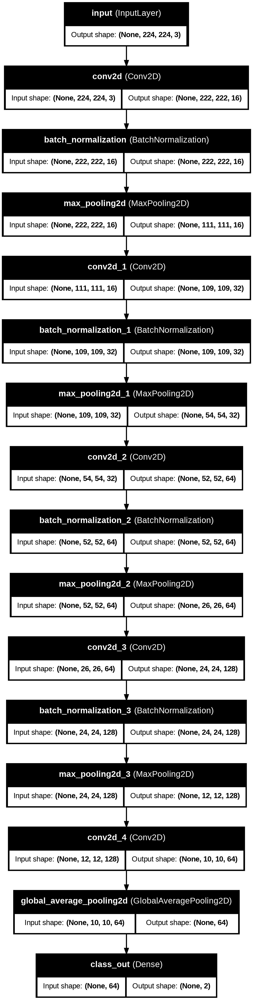

In [39]:
from tensorflow.keras.utils import plot_model
plot_model(model, show_shapes=True, show_layer_names=True, to_file='model_plots/custom_model.png')

In [40]:
get_ipython().system('rm -rf logs')


In [41]:
model.compile(
    optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"]
)

In [42]:
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir)
checkpoint = tf.keras.callbacks.ModelCheckpoint('saved_model/custom_best_model.h5', monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

In [43]:
callbacks_list = [checkpoint, tensorboard_callback]


In [44]:
num_epochs = 2 #@param {type:"number"}
steps_per_epoch_training = len(train_generator)
steps_per_epoch_validation = len(valid_generator)

In [ ]:
history = model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch_training,
    epochs=num_epochs,
    validation_data=valid_generator,
    validation_steps=steps_per_epoch_validation,
    verbose=1,
    callbacks=[callbacks_list]
)


Epoch 1/2
173/303 ━━━━━━━━━━━━━━━━━━━━ 1:18:09 36s/step - accuracy: 0.8949 - loss: 0.3033

In [ ]:
%load_ext tensorboard


In [ ]:
%tensorboard --logdir /content/gdrive/MyDrive/logs


<IPython.core.display.Javascript object>

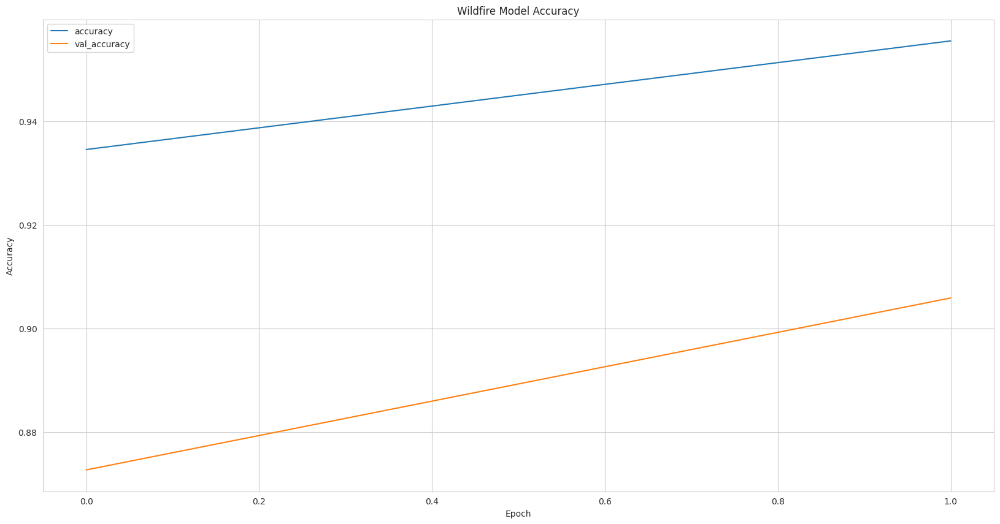

In [ ]:
plot_acc(history)


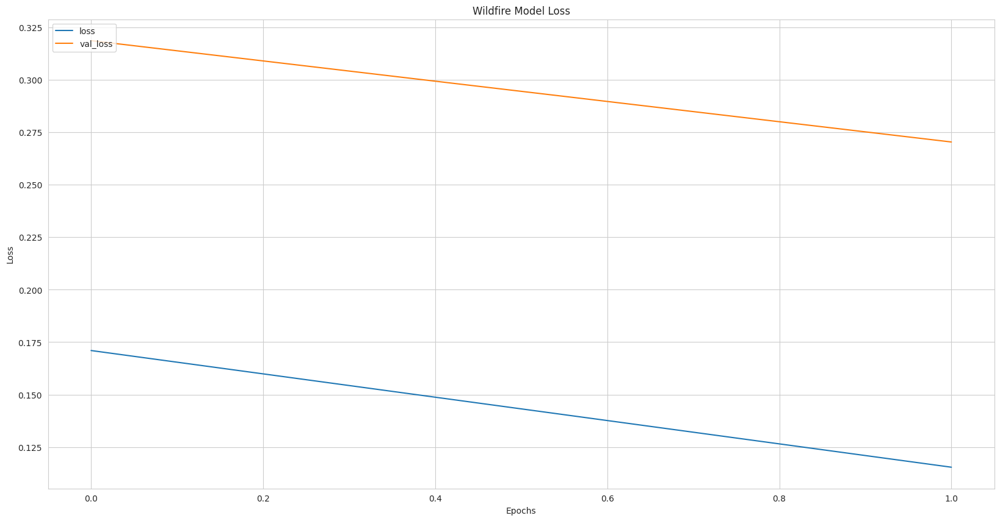

In [ ]:
plot_loss(history)


In [ ]:
model.save('saved_model/custom_model.keras') # Added .keras extension to the filepath
print("Model saved!")

Model saved!


In [ ]:
model.save('saved_model/custom_model.h5')
print("Model saved!")

Model saved!


In [ ]:
test_generator = data_generator.flow_from_directory(test_path,
                                                   batch_size = batch_size_test,
                                                   target_size = (im_size, im_size),
                                                   class_mode = 'categorical')

Found 6300 images belonging to 2 classes.


In [ ]:
filenames = test_generator.filenames


In [ ]:
pred = model.predict(test_generator, steps=len(test_generator), verbose=1).round(3)

63/63 ━━━━━━━━━━━━━━━━━━━━ 91s 1s/step


In [ ]:
filenames_df = pd.DataFrame(filenames, columns=['File Path'])
pred_df = pd.DataFrame(pred, columns=['No Wildfire Probability', 'Wildfire Probability'])
model_predictions = pd.concat([filenames_df, pred_df], axis=1)
model_predictions

,File Path,No Wildfire Probability,Wildfire Probability
0,"nowildfire/-113.91777,50.901087.jpg",0.000,1.000
1,"nowildfire/-113.91782,50.896917.jpg",0.000,1.000
2,"nowildfire/-113.91793,51.091205.jpg",0.000,1.000
3,"nowildfire/-113.918016,50.978447.jpg",0.851,0.149
4,"nowildfire/-113.918155,51.129969.jpg",0.000,1.000
...,...,...,...
6295,"wildfire/-79.48666,47.60672.jpg",0.000,1.000
6296,"wildfire/-79.489,49.16667.jpg",0.000,1.000
6297,"wildfire/-79.49726,48.89808.jpg",0.999,0.001
6298,"wildfire/-79.50932,48.06745.jpg",0.000,1.000


In [ ]:

file_name='/content/gdrive/MyDrive/custom_model_predictions.csv'
model_predictions.to_csv(file_name, sep=',', encoding='utf-8')

In [ ]:
outputs = [layer.output for layer in model.layers[1:9]]


In [ ]:
vis_model = Model(model.input, outputs)


In [ ]:
layer_names = []
for layer in outputs:
    layer_names.append(layer.name.split("/")[0])

In [ ]:
print("Layers that will be used for visualization: ")
print(layer_names)

Layers that will be used for visualization: 
['keras_tensor_15', 'keras_tensor_16', 'keras_tensor_17', 'keras_tensor_18', 'keras_tensor_19', 'keras_tensor_20', 'keras_tensor_21', 'keras_tensor_22']


In [ ]:
gap_weights = model.layers[-1].get_weights()[0]
gap_weights.shape

(64, 2)

In [ ]:
cam_model  = Model(inputs=model.input, outputs=(model.layers[-3].output,model.layers[-1].output))
cam_model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)                   │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 222, 222, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 222, 222, 16)        │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 32)        │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 109, 109, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 52, 52, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 52, 52, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 26, 26, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 24, 24, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 24, 24, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 12, 12, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 10, 10, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 64)                  │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ class_out (Dense)                    │ (None, 2)                   │             130 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 172,322 (673.13 KB)

 Trainable params: 171,842 (671.26 KB)

 Non-trainable params: 480 (1.88 KB)

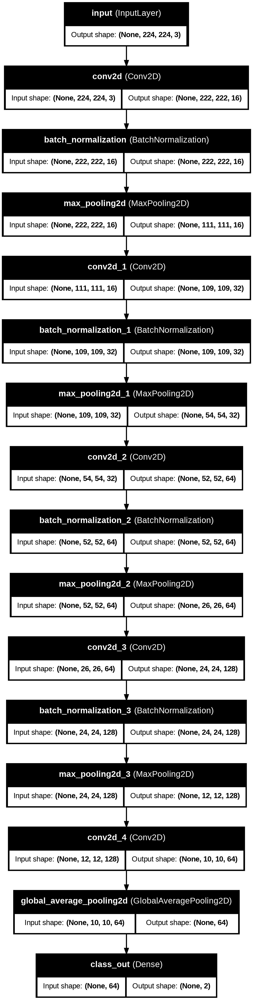

In [ ]:
plot_model(cam_model, show_shapes=True, show_layer_names=True, to_file='model_plots/cam_model.png')


In [ ]:
cam_model.save('saved_model/cam_model.keras') # Added .keras extension to the filepath
print("Model saved!")

Model saved!


In [ ]:
def show_cam(image_value, features, results):

  features_for_img = features[0]
  prediction = results[0]

  class_activation_weights = gap_weights[:,0]
  class_activation_features = sp.ndimage.zoom(features_for_img, (im_size/10, im_size/10, 1), order=2)
  cam_output  = np.dot(class_activation_features,class_activation_weights)

  # Visualize the results
  plt.figure(figsize=(12, 12))
  plt.imshow(cam_output, cmap='jet', alpha=0.5)
  plt.imshow(tf.squeeze(image_value), alpha=0.5)
  plt.title('Class Activation Map')
  plt.figtext(.5, .05, f"No Wildfire Probability: {results[0][0] * 100}%\nWildfire Probability: {results[0][1] * 100}%", ha="center", fontsize=12, bbox={"facecolor":"green", "alpha":0.5, "pad":3})
  plt.colorbar()
  plt.show()

In [ ]:
def convert_and_classify(image):

  img = cv2.imread(image)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  img = cv2.resize(img, (im_size, im_size)) / 255.0
  tensor_image = np.expand_dims(img, axis=0)
  features, results = cam_model.predict(tensor_image)

  # generate the CAM
  show_cam(tensor_image, features, results)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


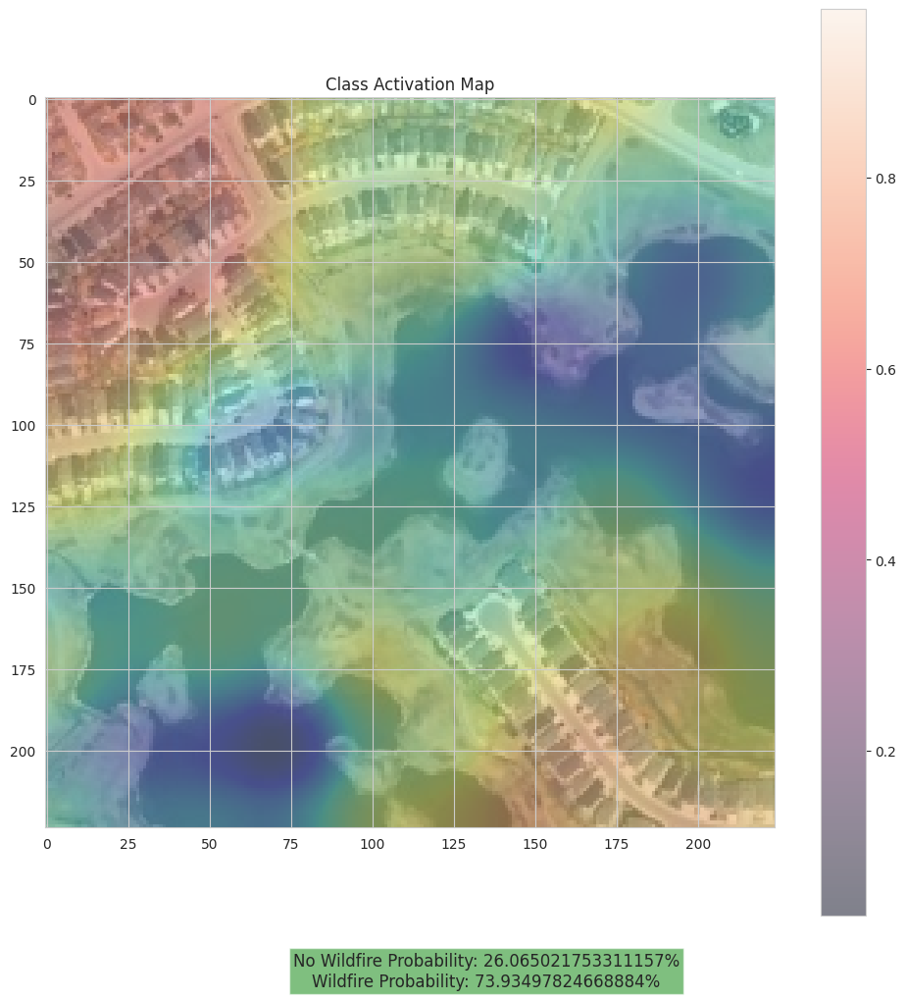

In [ ]:
convert_and_classify('/content/gdrive/MyDrive/test/nowildfire/-113.91777,50.901087.jpg')


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


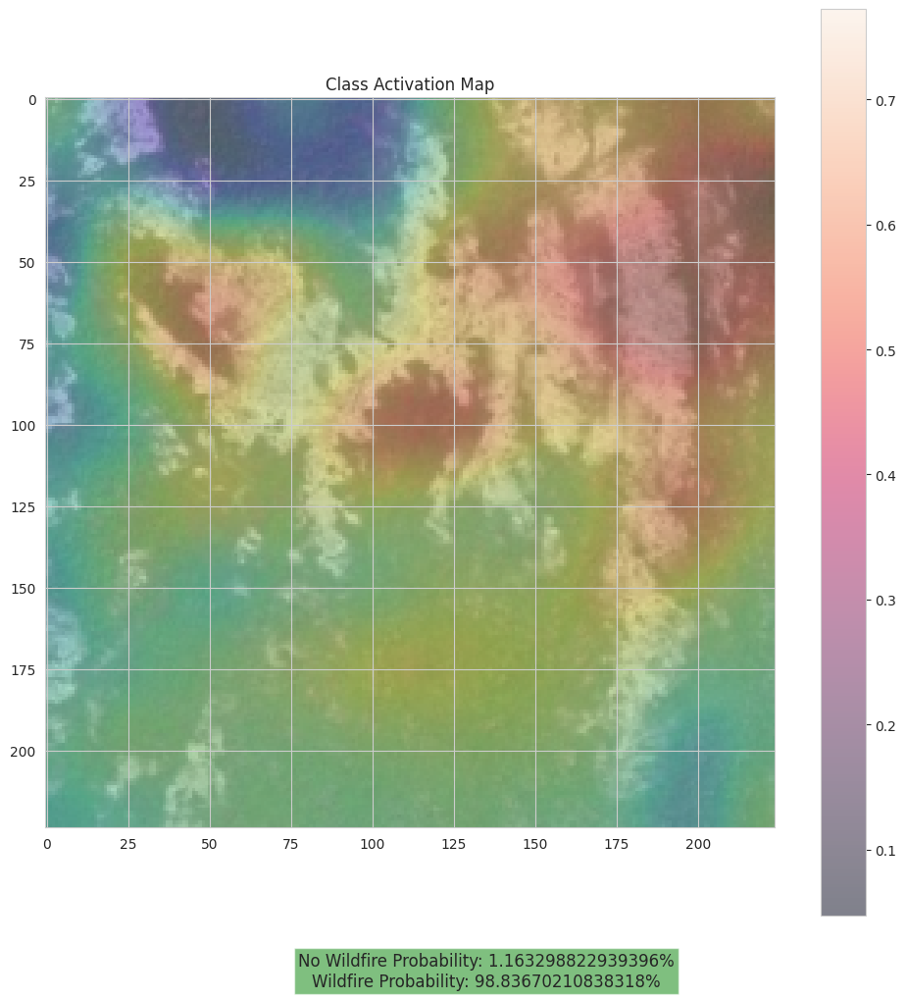

In [ ]:
convert_and_classify('/content/gdrive/MyDrive/test/wildfire/-59.03238,51.85132.jpg')


In [ ]:
from google.colab import files
from keras.preprocessing import image
from numpy import asarray

In [ ]:
uploaded = files.upload()

CAM Model Predicton:

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


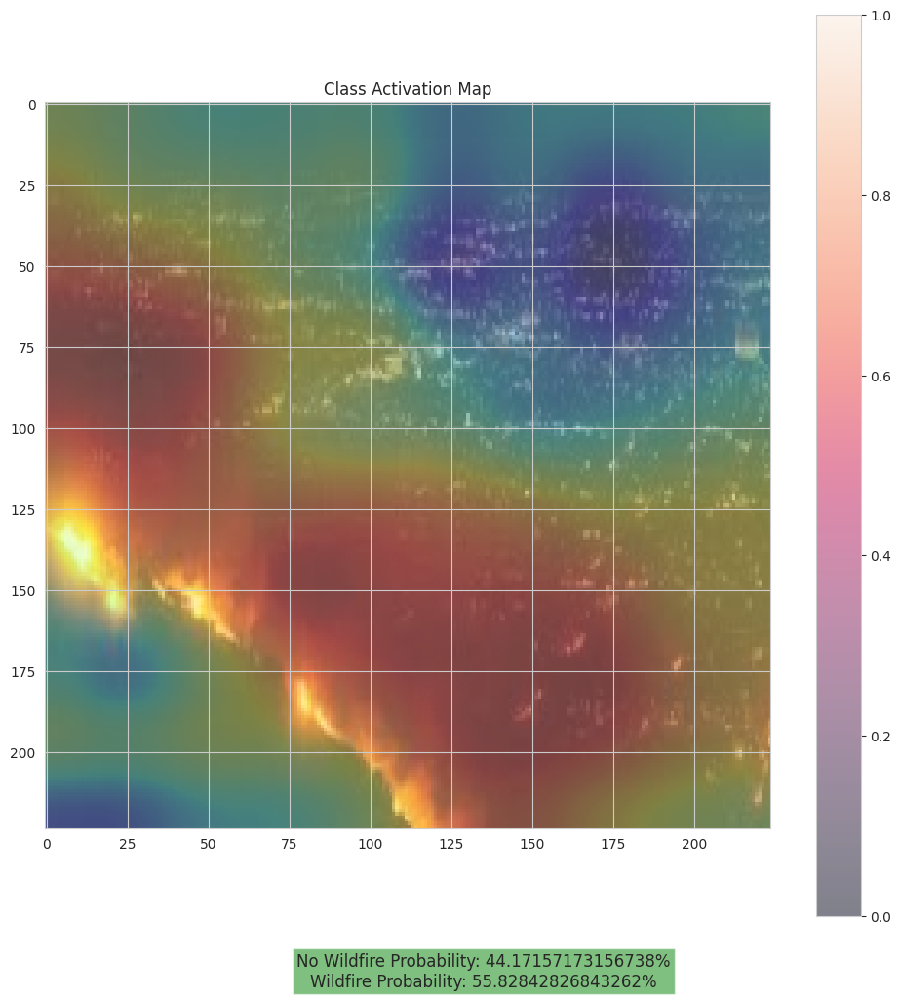

In [ ]:
for fn in uploaded.keys():

  # CAM Model Prediction
  width = im_size
  height = im_size
  dim = (width, height)
  # Check if the file exists
  path = '/content/gdrive/MyDrive/' + fn
  if not os.path.exists(path):
    print(f"Error: File not found at {path}")
    continue  # Skip to the next file
  img = cv2.imread(path)
  print('CAM Model Predicton:\n')
  convert_and_classify(path)

In [ ]:
import joblib
import tensorflow as tf

# Load the trained Keras model
# Corrected file path to include the full path
model = tf.keras.models.load_model("/content/gdrive/MyDrive/saved_model/custom_model.keras")

# Save model using joblib
joblib.dump(model, "/content/gdrive/MyDrive/saved_model/custom_model.joblib")

print("Model saved as joblib: custom_model.joblib")

Model saved as joblib: custom_model.joblib
